#Election Data Analysis

Dataset Link:https://www.kaggle.com/code/paramarthasengupta/eda-plotly-prediction-indian-elections-2019/input

In [64]:
import pandas as pd
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
import matplotlib.pyplot as plt
import seaborn as sns

In [65]:
# Load the data
df = pd.read_csv('/content/LS_2.0.csv.xls', delimiter=',')

In [66]:
# Replace newlines and standardize column names
df.columns = df.columns.str.replace('\n', ' ', regex=True).str.upper().str.strip()


print(df.columns)  # To check the new column names

Index(['STATE', 'CONSTITUENCY', 'NAME', 'WINNER', 'PARTY', 'SYMBOL', 'GENDER',
       'CRIMINAL CASES', 'AGE', 'CATEGORY', 'EDUCATION', 'ASSETS',
       'LIABILITIES', 'GENERAL VOTES', 'POSTAL VOTES', 'TOTAL VOTES',
       'OVER TOTAL ELECTORS  IN CONSTITUENCY',
       'OVER TOTAL VOTES POLLED  IN CONSTITUENCY', 'TOTAL ELECTORS'],
      dtype='object')


In [67]:
# Display the first few rows of the DataFrame to understand what kind of data it contains
print("First few rows of the dataset:")
print(df.head())

First few rows of the dataset:
           STATE CONSTITUENCY                   NAME  WINNER PARTY SYMBOL  \
0      Telangana     ADILABAD         SOYAM BAPU RAO       1   BJP  Lotus   
1      Telangana     ADILABAD           Godam Nagesh       0   TRS    Car   
2      Telangana     ADILABAD          RATHOD RAMESH       0   INC   Hand   
3      Telangana     ADILABAD                   NOTA       0  NOTA    NaN   
4  Uttar Pradesh         AGRA  Satyapal Singh Baghel       1   BJP  Lotus   

  GENDER CRIMINAL CASES   AGE CATEGORY      EDUCATION  \
0   MALE             52  52.0       ST      12th Pass   
1   MALE              0  54.0       ST  Post Graduate   
2   MALE              3  52.0       ST      12th Pass   
3    NaN            NaN   NaN      NaN            NaN   
4   MALE              5  58.0       SC      Doctorate   

                        ASSETS                  LIABILITIES  GENERAL VOTES  \
0    Rs 30,99,414\n ~ 30 Lacs+      Rs 2,31,450\n ~ 2 Lacs+         376892   
1  Rs 1

In [68]:
# Display the DataFrame's information to understand the column types and non-null counts
print("\nData types and non-null counts:")
print(df.info())


Data types and non-null counts:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2263 entries, 0 to 2262
Data columns (total 19 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   STATE                                     2263 non-null   object 
 1   CONSTITUENCY                              2263 non-null   object 
 2   NAME                                      2263 non-null   object 
 3   WINNER                                    2263 non-null   int64  
 4   PARTY                                     2263 non-null   object 
 5   SYMBOL                                    2018 non-null   object 
 6   GENDER                                    2018 non-null   object 
 7   CRIMINAL CASES                            2018 non-null   object 
 8   AGE                                       2018 non-null   float64
 9   CATEGORY                                  2018 non-null   object 
 10  EDU

In [69]:
# Check for missing values in each column
print("\nMissing values in each column:")
print(df.isnull().sum())


Missing values in each column:
STATE                                         0
CONSTITUENCY                                  0
NAME                                          0
WINNER                                        0
PARTY                                         0
SYMBOL                                      245
GENDER                                      245
CRIMINAL CASES                              245
AGE                                         245
CATEGORY                                    245
EDUCATION                                   245
ASSETS                                      245
LIABILITIES                                 245
GENERAL VOTES                                 0
POSTAL VOTES                                  0
TOTAL VOTES                                   0
OVER TOTAL ELECTORS  IN CONSTITUENCY          0
OVER TOTAL VOTES POLLED  IN CONSTITUENCY      0
TOTAL ELECTORS                                0
dtype: int64


In [70]:
# Check the data types of each column
print("\nData types of each column:")
print(df.dtypes)


Data types of each column:
STATE                                        object
CONSTITUENCY                                 object
NAME                                         object
WINNER                                        int64
PARTY                                        object
SYMBOL                                       object
GENDER                                       object
CRIMINAL CASES                               object
AGE                                         float64
CATEGORY                                     object
EDUCATION                                    object
ASSETS                                       object
LIABILITIES                                  object
GENERAL VOTES                                 int64
POSTAL VOTES                                  int64
TOTAL VOTES                                   int64
OVER TOTAL ELECTORS  IN CONSTITUENCY        float64
OVER TOTAL VOTES POLLED  IN CONSTITUENCY    float64
TOTAL ELECTORS                      

In [71]:
# Get a statistical summary of the numeric columns
print("\nStatistical summary of numeric columns:")
print(df.describe())


Statistical summary of numeric columns:
            WINNER          AGE  GENERAL VOTES  POSTAL VOTES   TOTAL VOTES  \
count  2263.000000  2018.000000   2.263000e+03   2263.000000  2.263000e+03   
mean      0.238179    52.273538   2.615991e+05    990.710561  2.625898e+05   
std       0.426064    11.869373   2.549906e+05   1602.839174  2.559822e+05   
min       0.000000    25.000000   1.339000e+03      0.000000  1.342000e+03   
25%       0.000000    43.250000   2.103450e+04     57.000000  2.116250e+04   
50%       0.000000    52.000000   1.539340e+05    316.000000  1.544890e+05   
75%       0.000000    61.000000   4.858040e+05   1385.000000  4.872315e+05   
max       1.000000    86.000000   1.066824e+06  19367.000000  1.068569e+06   

       OVER TOTAL ELECTORS  IN CONSTITUENCY  \
count                           2263.000000   
mean                              15.811412   
std                               14.962861   
min                                0.097941   
25%                  

In [72]:
df.columns = df.columns.str.strip()

In [73]:
# Print the number of unique values in each categorical column
print("\nUnique values in each categorical column:")
for col in df.select_dtypes(include=['object']).columns:
    print(f"{col}: {df[col].nunique()} unique values")


Unique values in each categorical column:
STATE: 36 unique values
CONSTITUENCY: 539 unique values
NAME: 2014 unique values
PARTY: 133 unique values
SYMBOL: 126 unique values
GENDER: 2 unique values
CRIMINAL CASES: 29 unique values
CATEGORY: 3 unique values
EDUCATION: 13 unique values
ASSETS: 1979 unique values
LIABILITIES: 1226 unique values


In [74]:
# Frequency counts for categorical data
print("\nFrequency counts for 'party' column:")
print(df['PARTY'].value_counts())

print("\nFrequency counts for 'state' column:")
print(df['STATE'].value_counts())


Frequency counts for 'party' column:
PARTY
BJP       420
INC       413
NOTA      245
IND       201
BSP       163
         ... 
KEC(M)      1
KEC         1
JAPL        1
AKBMP       1
PHJSP       1
Name: count, Length: 133, dtype: int64

Frequency counts for 'state' column:
STATE
Uttar Pradesh                274
Bihar                        244
Tamil Nadu                   217
West Bengal                  193
Maharashtra                  192
Andhra Pradesh               121
Madhya Pradesh               103
Gujarat                       87
Rajasthan                     86
Odisha                        85
Telangana                     83
Karnataka                     77
Jharkhand                     73
Kerala                        63
Punjab                        62
Assam                         52
Chhattisgarh                  45
Haryana                       41
Jammu & Kashmir               29
NCT OF Delhi                  24
Uttarakhand                   16
Arunachal Pradesh         

**Party Dominance by State**

In [75]:
import geopandas as gpd
import os

# Set the GDAL configuration to restore SHX files
os.environ["SHAPE_RESTORE_SHX"] = "YES"

# Now try reading the shapefile again
gdf = gpd.read_file('/content/Indian_States.shp')

# Display the first few rows to understand the data
print(gdf.head())


                                            geometry
0  MULTIPOLYGON (((93.71976 7.20707, 93.71909 7.2...
1  POLYGON ((96.16261 29.38078, 96.1686 29.37432,...
2  MULTIPOLYGON (((89.74323 26.30362, 89.7429 26....
3  MULTIPOLYGON (((84.5072 24.26323, 84.50355 24....
4  POLYGON ((76.84147 30.75996, 76.83599 30.73623...


In [76]:
# Print the column names to see which column corresponds to the state name
print(gdf.columns)

Index(['geometry'], dtype='object')


In [77]:
# Ensure the states are listed in the same order as their geometries
state_names = df['STATE'].drop_duplicates().tolist()

# Assign these state names to the gdf if they correctly correspond to the order of geometries
gdf['STATE'] = state_names

# Verify the assignment
print(gdf.head())


                                            geometry          STATE
0  MULTIPOLYGON (((93.71976 7.20707, 93.71909 7.2...      Telangana
1  POLYGON ((96.16261 29.38078, 96.1686 29.37432,...  Uttar Pradesh
2  MULTIPOLYGON (((89.74323 26.30362, 89.7429 26....    Maharashtra
3  MULTIPOLYGON (((84.5072 24.26323, 84.50355 24....        Gujarat
4  POLYGON ((76.84147 30.75996, 76.83599 30.73623...      Rajasthan


In [78]:
winners = df[df['WINNER'] == 1]

# Count wins per party in each state
party_wins = winners.groupby(['STATE', 'PARTY']).size().unstack(fill_value=0)

# Determine the party with the most wins in each state
dominant_party = party_wins.idxmax(axis=1)
dominant_party_counts = party_wins.max(axis=1)
dominant_party = pd.DataFrame({'Dominant Party': dominant_party, 'Number of Wins': dominant_party_counts})

# Merging this data back to the geographical dataframe
gdf = gdf.merge(dominant_party, how='left', on='STATE')


In [79]:
gdf.head()

,geometry,STATE,Dominant Party,Number of Wins
0,"MULTIPOLYGON (((93.71976 7.20707, 93.71909 7.2...",Telangana,TRS,9
1,"POLYGON ((96.16261 29.38078, 96.1686 29.37432,...",Uttar Pradesh,BJP,60
2,"MULTIPOLYGON (((89.74323 26.30362, 89.7429 26....",Maharashtra,BJP,22
3,"MULTIPOLYGON (((84.5072 24.26323, 84.50355 24....",Gujarat,BJP,26
4,"POLYGON ((76.84147 30.75996, 76.83599 30.73623...",Rajasthan,BJP,24


In [80]:
gdf1=gdf

In [81]:
gdf1.head()

,geometry,STATE,Dominant Party,Number of Wins
0,"MULTIPOLYGON (((93.71976 7.20707, 93.71909 7.2...",Telangana,TRS,9
1,"POLYGON ((96.16261 29.38078, 96.1686 29.37432,...",Uttar Pradesh,BJP,60
2,"MULTIPOLYGON (((89.74323 26.30362, 89.7429 26....",Maharashtra,BJP,22
3,"MULTIPOLYGON (((84.5072 24.26323, 84.50355 24....",Gujarat,BJP,26
4,"POLYGON ((76.84147 30.75996, 76.83599 30.73623...",Rajasthan,BJP,24


In [82]:
gdf['Dominant Party'] = gdf['Dominant Party'].astype('category')

In [83]:
# Ensure 'Dominant Party' is a categorical column
gdf['Dominant Party'] = gdf['Dominant Party'].astype('category')

# Check data before plotting
print(gdf[['STATE', 'Dominant Party']].head())
gdf = gdf.dropna()
print(gdf['Dominant Party'].dtype)

           STATE Dominant Party
0      Telangana            TRS
1  Uttar Pradesh            BJP
2    Maharashtra            BJP
3        Gujarat            BJP
4      Rajasthan            BJP
category


In [84]:
import pandas as pd

# Group by 'STATE' and 'PARTY', and count the number of wins for each party in each state
state_party_wins = df[df['WINNER'] == 1].groupby(['STATE', 'PARTY']).size().reset_index(name='Seats Won')

# Determine which party won the most seats in each state
dominant_party_by_seats = state_party_wins.loc[state_party_wins.groupby('STATE')['Seats Won'].idxmax()]

# Filter for West Bengal or include all states if preparing for nationwide map visualization
west_bengal_majority = dominant_party_by_seats[dominant_party_by_seats['STATE'] == 'West Bengal']
print(west_bengal_majority)


          STATE PARTY  Seats Won
82  West Bengal  AITC         22


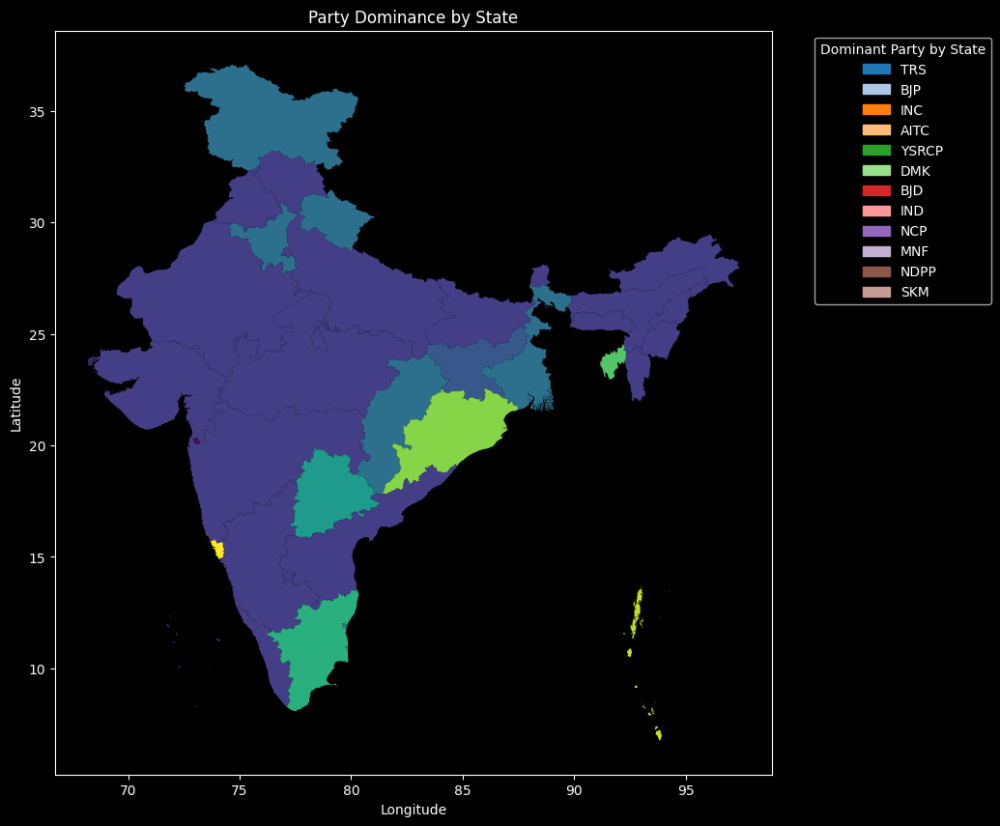

In [85]:
# Merge the results back to the geodataframe
gdf = gdf.merge(dominant_party_by_seats, how='left', left_on='STATE', right_on='STATE')


party_colors = {party: plt.cm.tab20(i) for i, party in enumerate(gdf['PARTY'].unique())}

# Create legend patches
legend_patches = [mpatches.Patch(color=color, label=label) for label, color in party_colors.items()]

# Plotting
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
gdf.plot(column='PARTY', ax=ax, legend=False, cmap='viridis')  # Use 'viridis' or map colors directly if preferred

# Add custom legend
ax.legend(handles=legend_patches, title="Dominant Party by State", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.title('Party Dominance by State')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [86]:
import pandas as pd
import plotly.express as px

#  'gdf' is  the GeoDataFrame merged with the election data
# Compute the dominant party for each state
dominant_party_by_state = gdf.groupby('STATE')['PARTY'].agg(lambda x: x.value_counts().idxmax())

# Convert this to a DataFrame for plotting
dominant_party_df = dominant_party_by_state.reset_index()
dominant_party_df.columns = ['State', 'Dominant Party']

# Create a count of states for each party to plot
party_count = dominant_party_df['Dominant Party'].value_counts().reset_index()
party_count.columns = ['Party', 'Count of States']

# Plotting with Plotly
fig = px.bar(party_count, x='Count of States', y='Party', orientation='h',
             color='Party', title='Dominant Party by State')

# Enhance the chart with labels and a layout
fig.update_layout(xaxis_title='Count of States', yaxis_title='Party',
                  coloraxis_showscale=False)  # Hide color scale if not needed

# Show the plot
fig.show()
fig.write_html("Party Dominance by State.html")

**Impact of Criminal Background on Election Outcomes**

<ipython-input-87-5ff28155c015>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-87-5ff28155c015>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




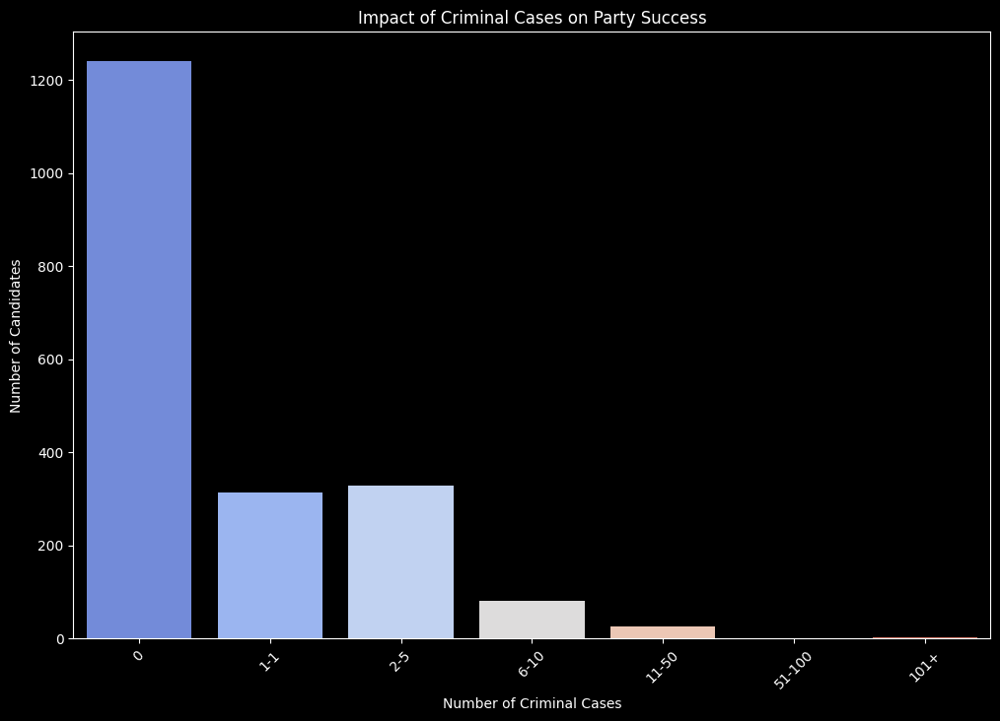

In [87]:
df['CRIMINAL CASES'] = pd.to_numeric(df['CRIMINAL CASES'], errors='coerce')


df = df.dropna(subset=['CRIMINAL CASES'])

# Convert 'CRIMINAL CASES' into categories for better visualization
df['CRIMINAL CASES'] = pd.cut(df['CRIMINAL CASES'], bins=[-1, 0, 1, 5, 10, 50, 100, 500], labels=['0', '1-1', '2-5', '6-10', '11-50', '51-100', '101+'])

# Count the number of candidates in each category
case_counts = df['CRIMINAL CASES'].value_counts().sort_index()

# Plotting
plt.figure(figsize=(12, 8))
sns.barplot(x=case_counts.index, y=case_counts.values, palette='coolwarm')
plt.title('Impact of Criminal Cases on Party Success')
plt.xlabel('Number of Criminal Cases')
plt.ylabel('Number of Candidates')
plt.xticks(rotation=45)  # Rotate labels to fit longer categories
plt.show()


In [88]:
import plotly.express as px

# Assuming df['CRIMINAL CASES'] has already been prepared as described
#df['CRIMINAL CASES'] = pd.to_numeric(df['CRIMINAL CASES'], errors='coerce')
#df = df.dropna(subset=['CRIMINAL CASES'])

# Convert 'CRIMINAL CASES' into categories for better visualization
#df['CRIMINAL CASES'] = pd.cut(df['CRIMINAL CASES'], bins=[-1, 0, 1, 5, 10, 50, 100, 500], labels=['0', '1-1', '2-5', '6-10', '11-50', '51-100', '101+'])

# Count the number of candidates in each category
case_counts = df['CRIMINAL CASES'].value_counts().sort_index().reset_index()
case_counts.columns = ['Criminal Cases Category', 'Number of Candidates']  # Renaming columns for clarity

# Create an interactive bar plot using Plotly Express
fig = px.bar(case_counts,
             x='Criminal Cases Category',
             y='Number of Candidates',
             title='Impact of Criminal Cases on Party Success',
             labels={'Criminal Cases Category': 'Number of Criminal Cases', 'Number of Candidates': 'Number of Candidates'},
             color='Number of Candidates',  # Color bars by number of candidates
             color_continuous_scale=px.colors.sequential.Cividis)  # Use a sequential color scale from Plotly's predefined palettes

# Enhance the layout for better readability
fig.update_layout(xaxis_title='Number of Criminal Cases',
                  yaxis_title='Number of Candidates',
                  xaxis={'categoryorder':'total descending'},  # Sort bars by descending order of candidates
                  coloraxis_colorbar=dict(title='Candidates Count'))

# Show the plot
fig.show()
fig.write_html("Impact of Criminal Background on Election Outcomes.html")

**Gender Representation in Politics**

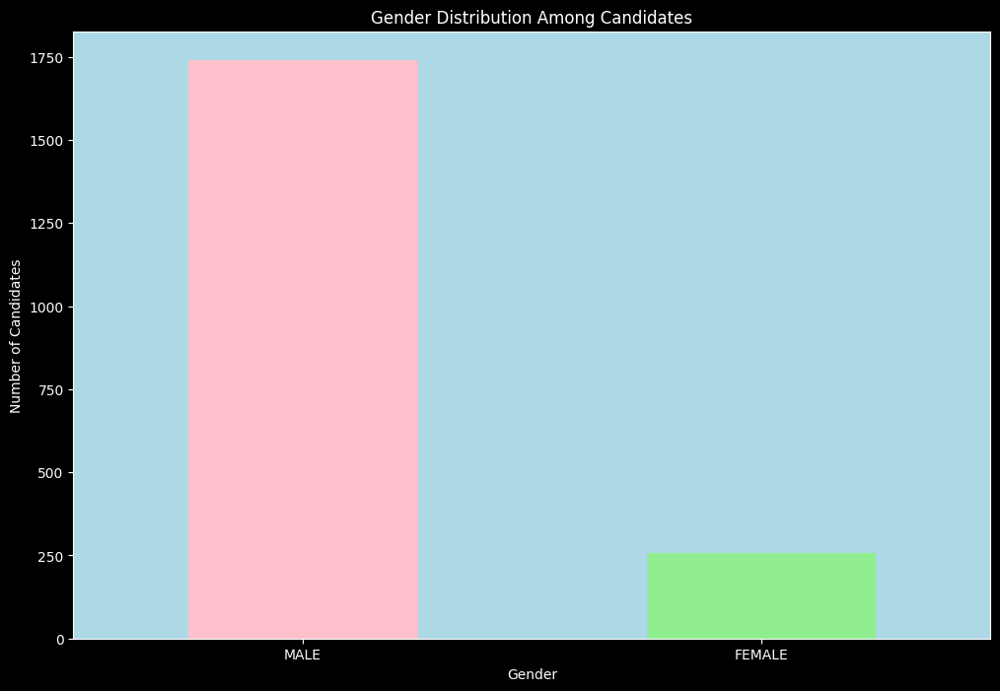

In [89]:
# Colorful background
plt.figure(figsize=(12, 8))
ax = plt.axes()
ax.set_facecolor("lightblue")  # Setting a light blue background

gender_counts = df['GENDER'].value_counts()

gender_counts.plot(kind='bar', color=['pink', 'lightgreen'])
plt.title('Gender Distribution Among Candidates')
plt.xlabel('Gender')
plt.ylabel('Number of Candidates')
plt.xticks(rotation=0)
plt.show()

In [90]:
import plotly.express as px

# Assuming 'df' already has a 'GENDER' column with relevant data
gender_counts = df['GENDER'].value_counts().reset_index()
gender_counts.columns = ['Gender', 'Number of Candidates']  # Renaming for clarity

# Create an interactive bar plot using Plotly Express
fig = px.bar(gender_counts,
             x='Gender',
             y='Number of Candidates',
             title='Gender Distribution Among Candidates',
             color='Gender',  # Different colors for different genders
             color_discrete_map={'MALE': 'lightgreen', 'FEMALE': 'pink'},  # Custom color mapping
             text='Number of Candidates')  # Display counts on bars

# Customize the layout
fig.update_layout(
    xaxis_title='Gender',
    yaxis_title='Number of Candidates',
    plot_bgcolor='lightblue',  # Setting plot background color
    showlegend=False  # Hide legend if not necessary
)

# Show the plot
fig.show()
fig.write_html("Gender Distribution Among Candidates.html")

**Age Distribution Among Elected Candidates**

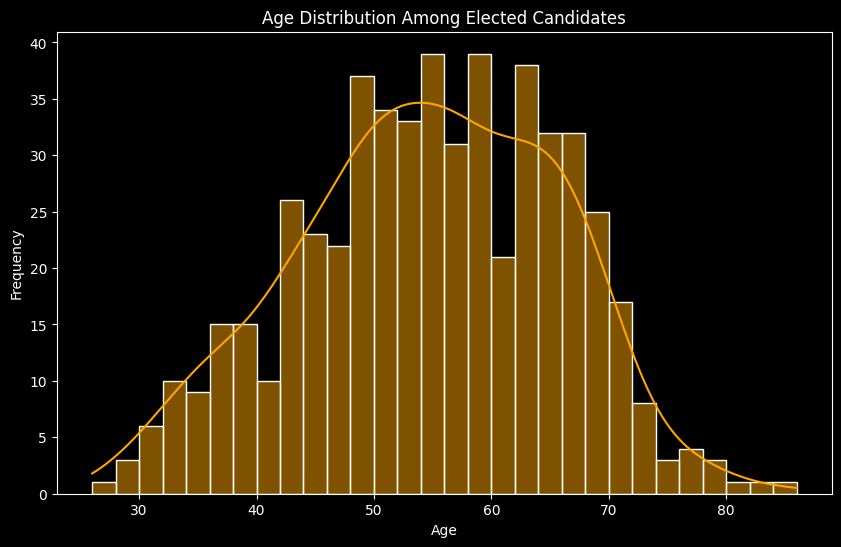

In [91]:
# Dark background again for a histogram
plt.style.use('dark_background')

plt.figure(figsize=(10, 6))
sns.histplot(df[df['WINNER'] == 1]['AGE'], bins=30, kde=True, color='orange')
plt.title('Age Distribution Among Elected Candidates')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

In [92]:
import plotly.express as px

# Filter the dataset to include only elected candidates
elected_candidates = df[df['WINNER'] == 1]

# Create an interactive histogram using Plotly Express
fig = px.histogram(elected_candidates,
                   x='AGE',
                   nbins=30,  # Number of bins
                   title='Age Distribution Among Elected Candidates',
                   color_discrete_sequence=['orange'],  # Set bar color
                   marginal='rug',  # Add a rug plot
                   template='plotly_dark')  # Use a dark theme

# Customize the layout
fig.update_layout(
    xaxis_title='Age',
    yaxis_title='Frequency',
    bargap=0.1  # Gap between bars
)

# Show the plot
fig.show()
fig.write_html("Age Distribution Among Elected Candidates.html")

**Distribution of Constituencies Over All the States**

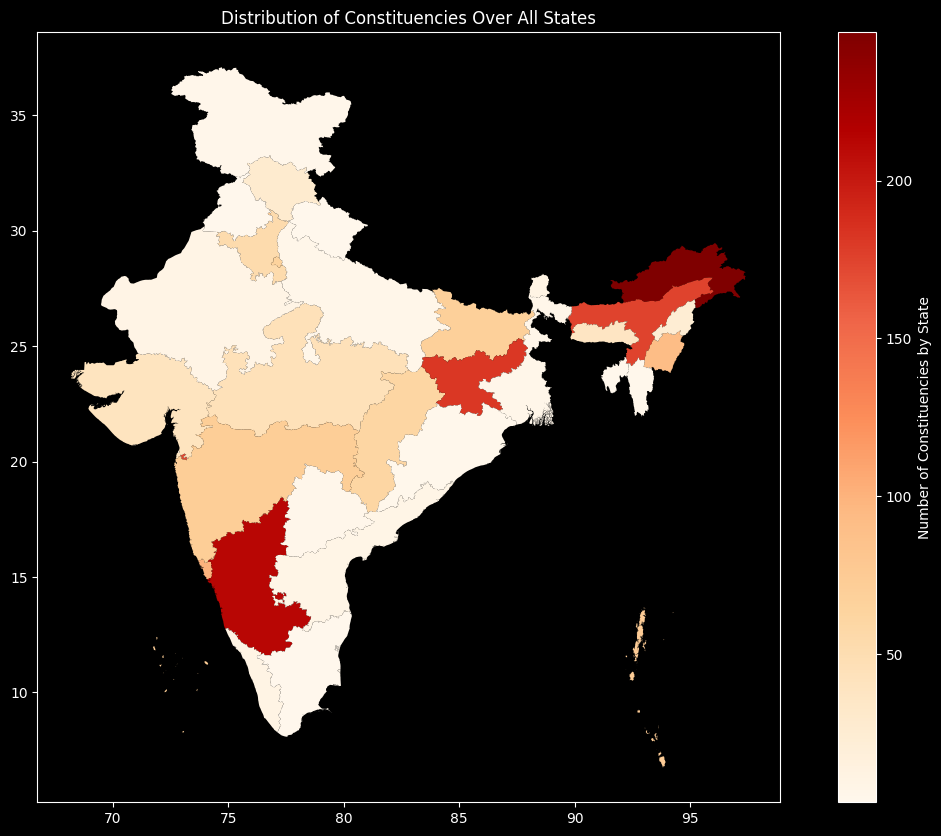

In [93]:
#gdf1 = gpd.read_file('/content/Indian_States.shp')
# Aggregate the data to count constituencies in each state
constituency_count = df.groupby('STATE').size().reset_index(name='constituency_count')

# Merge this with the GeoDataFrame
gdf1 = gdf1.merge(constituency_count, how='left', left_on='STATE', right_on='STATE')

# Plotting
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
gdf1.plot(column='constituency_count', ax=ax, legend=True, cmap='OrRd',
         legend_kwds={'label': "Number of Constituencies by State"})
plt.title('Distribution of Constituencies Over All States')
plt.show()


In [94]:
import pandas as pd
import plotly.express as px

# Convert GeoDataFrame to DataFrame for easier handling in Plotly
constituency_data = gdf1[['STATE', 'constituency_count']]
constituency_data.columns = ['State', 'Constituencies']

# Create the interactive bar chart
fig = px.bar(constituency_data, x='Constituencies', y='State', orientation='h',
             color='Constituencies', title='Distribution of Constituencies Over All States')

# Enhance the chart with labels and a layout
fig.update_layout(xaxis_title='Number of Constituencies', yaxis_title='State',
                  coloraxis_showscale=True)

# Show the plot
fig.show()

In [95]:
import plotly.express as px
import geopandas as gpd
import pandas as pd

geojson = gdf1.__geo_interface__

# Create the choropleth map
fig = px.choropleth(gdf1,
                    geojson=geojson,
                    locations=gdf1.index,
                    color='constituency_count',
                    hover_name='STATE',  # Column to be displayed when hovering over
                    color_continuous_scale="Viridis",  # Color scale
                    projection="mercator"  # Map projection
                   )

fig.update_geos(fitbounds="locations", visible=False)  # Fit the map bounds to the locations
fig.update_layout(title="Distribution of Constituencies Over All States in India")
fig.show()
fig.write_html("Distribution of Constituencies Over All States.html")

**Which Party Has Won the Most Constituencies?**

<ipython-input-96-4d752e1758d3>:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




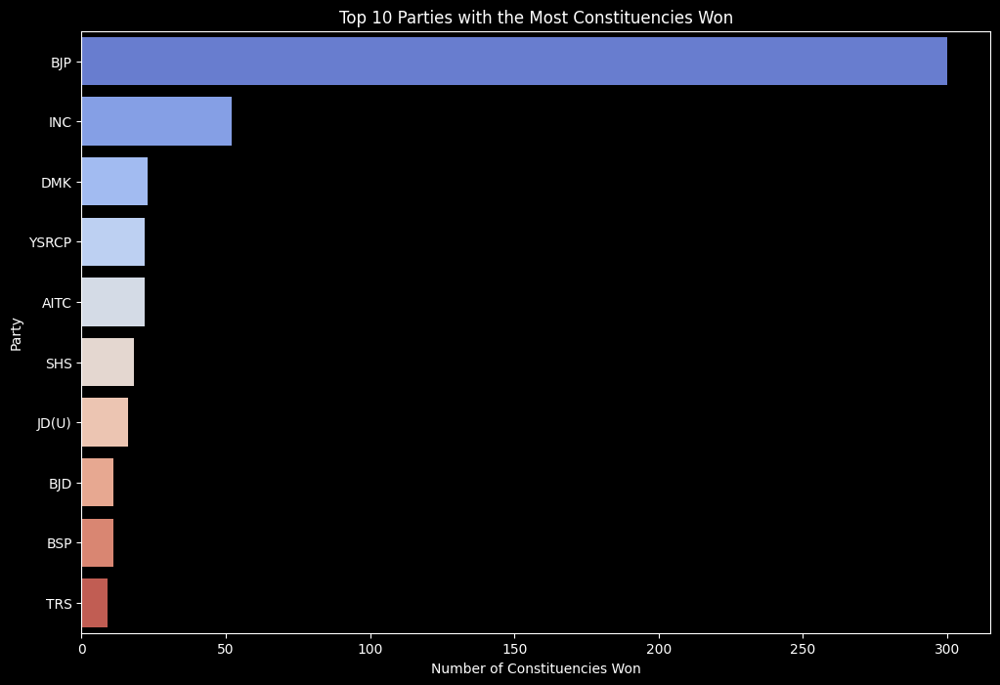

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'party_wins' contains the number of wins for the top 10 parties
party_wins = df[df['WINNER'] == 1]['PARTY'].value_counts().head(10)

# Plotting a horizontal bar chart
plt.figure(figsize=(12, 8))
sns.barplot(x=party_wins.values, y=party_wins.index, palette='coolwarm')
plt.title('Top 10 Parties with the Most Constituencies Won')
plt.xlabel('Number of Constituencies Won')
plt.ylabel('Party')
plt.show()

In [97]:
import plotly.express as px

# Assuming 'party_wins' is already prepared as described
party_wins = df[df['WINNER'] == 1]['PARTY'].value_counts().head(10).reset_index()
party_wins.columns = ['Party', 'Number of Constituencies Won']  # Renaming for clarity

# Create an interactive horizontal bar plot using Plotly Express
fig = px.bar(party_wins,
             y='Party',
             x='Number of Constituencies Won',
             title='Top 10 Parties with the Most Constituencies Won',
             orientation='h',  # Horizontal bar chart
             color='Party',  # Color bars by party
             color_continuous_scale='Viridis')  # Optional: use a color scale for aesthetic

# Customize the layout
fig.update_layout(
    xaxis_title='Number of Constituencies Won',
    yaxis_title='Party',
    coloraxis_showscale=False  # Optionally hide the color scale if not needed
)

# Show the plot
fig.show()
fig.write_html("Top 10 Parties with the Most Constituencies Won.html")

**Educational Qualifications of Winning Politicians by Party**

In [98]:
# Group by education and party, then count
education_party_counts = winners.groupby(['EDUCATION', 'PARTY']).size().unstack(fill_value=0)

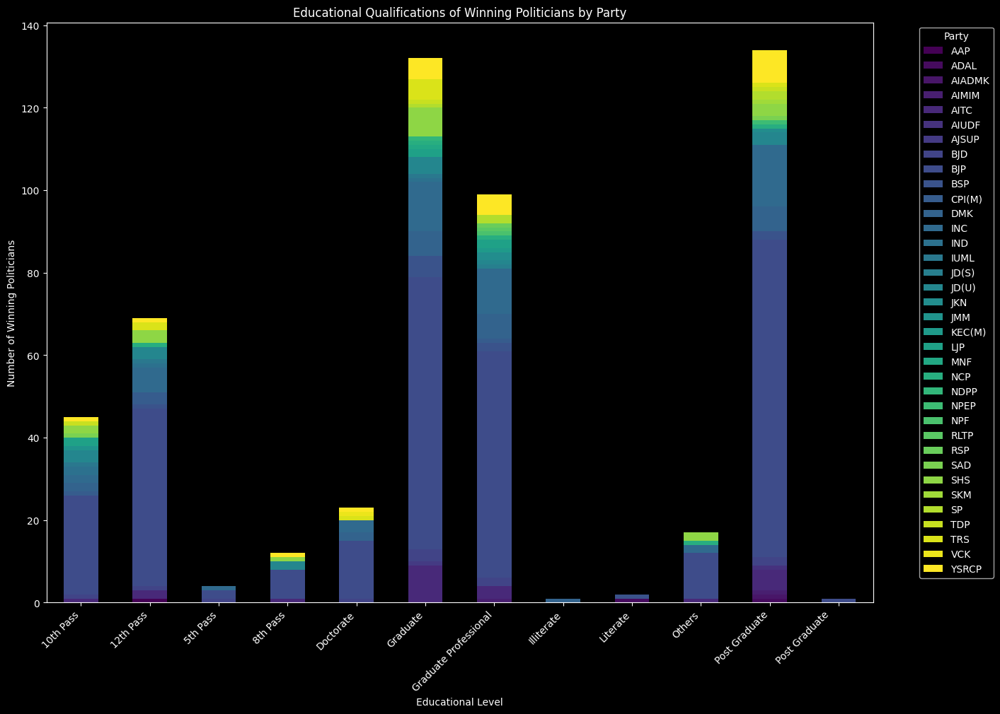

In [99]:
fig, ax = plt.subplots(figsize=(14, 10))  # Adjust figsize to give more room
education_party_counts.plot(kind='bar', stacked=True, colormap='viridis', ax=ax)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha="right")

# Move the legend outside of the plot to avoid covering data
plt.legend(title='Party', bbox_to_anchor=(1.05, 1), loc='upper left')

# Improve layout to prevent cutting off labels or legend
plt.tight_layout()

plt.title('Educational Qualifications of Winning Politicians by Party')
plt.xlabel('Educational Level')
plt.ylabel('Number of Winning Politicians')
plt.show()


In [100]:
import plotly.graph_objects as go

# Filter to include only major parties or those with a significant count
major_parties = education_party_counts.sum().nlargest(10).index  # Adjust number as needed

# Create the figure object
fig = go.Figure()

# Add a bar for each party
for party in major_parties:
    if party in education_party_counts.columns:
        fig.add_trace(go.Bar(
            x=education_party_counts.index,
            y=education_party_counts[party],
            name=party,
            hoverinfo='y+name'  # Shows the count and party name on hover
        ))

# Update layout for a stacked bar chart
fig.update_layout(
    barmode='stack',
    title='Educational Qualifications of Winning Politicians by Major Parties',
    xaxis_title='Educational Level',
    yaxis_title='Number of Winning Politicians',
    legend_title='Party',
    xaxis={'categoryorder':'total descending'},
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    hovermode='x'  # Allows hovering over all segments in the same category
)

# Rotate x-axis labels and enhance the readability
fig.update_xaxes(tickangle=45)

# Show the figure
fig.show()
fig.write_html("Educational Qualifications of Winning Politicians by Party.html")

**PREDICTION ALGORITHMS**


In [101]:
#Reading Dataset again
vote = pd.read_csv('/content/LS_2.0.csv.xls', delimiter=',')

In [102]:
# Replace newline characters and other formatting issues in column names
vote.columns = vote.columns.str.replace('\n', ' ', regex=True)

In [103]:
# Remove 'ASSETS' and 'LIABILITIES' columns from the DataFrame
vote_df = vote[vote['PARTY'] != 'NOTA'].drop(['ASSETS', 'LIABILITIES'], axis=1).copy()

In [104]:
# Convert 'CRIMINAL CASES' to numeric
vote_df['CRIMINAL CASES'] = pd.to_numeric(vote_df['CRIMINAL CASES'], errors='coerce')

# Replace 'GENDER' and 'CATEGORY' with numerical codes
gender_map = {'MALE': 1, 'FEMALE': 2}
category_map = {'GENERAL': 1, 'SC': 2, 'ST': 3}

vote_df['GENDER'] = vote_df['GENDER'].map(gender_map)
vote_df['CATEGORY'] = vote_df['CATEGORY'].map(category_map)

# Handle missing values
vote_df['CRIMINAL CASES'].fillna(0, inplace=True)  # Assuming 0 cases if data is missing
vote_df['GENDER'].fillna(0, inplace=True)  # Assuming '0' for unspecified
vote_df['CATEGORY'].fillna(0, inplace=True)  # Assuming '0' for unspecified

<ipython-input-104-c88654780603>:12: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



<ipython-input-104-c88654780603>:13: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or

In [105]:
# One-hot encode 'STATE', 'CONSTITUENCY', 'PARTY', and 'EDUCATION'
vote_df = pd.get_dummies(vote_df, columns=['STATE', 'CONSTITUENCY', 'PARTY', 'EDUCATION'], drop_first=True)

In [106]:
vote_df.head()

,NAME,WINNER,SYMBOL,GENDER,CRIMINAL CASES,AGE,CATEGORY,GENERAL VOTES,POSTAL VOTES,TOTAL VOTES,...,EDUCATION_8th Pass,EDUCATION_Doctorate,EDUCATION_Graduate,EDUCATION_Graduate Professional,EDUCATION_Illiterate,EDUCATION_Literate,EDUCATION_Not Available,EDUCATION_Others,EDUCATION_Post Graduate,EDUCATION_Post Graduate\n
0,SOYAM BAPU RAO,1,Lotus,1,52.0,52.0,3,376892,482,377374,...,False,False,False,False,False,False,False,False,False,False
1,Godam Nagesh,0,Car,1,0.0,54.0,3,318665,149,318814,...,False,False,False,False,False,False,False,False,True,False
2,RATHOD RAMESH,0,Hand,1,3.0,52.0,3,314057,181,314238,...,False,False,False,False,False,False,False,False,False,False
4,Satyapal Singh Baghel,1,Lotus,1,5.0,58.0,2,644459,2416,646875,...,False,True,False,False,False,False,False,False,False,False
5,Manoj Kumar Soni,0,Elephant,1,0.0,47.0,2,434199,1130,435329,...,False,False,False,False,False,False,False,False,True,False


In [107]:
from sklearn.model_selection import train_test_split

X = vote_df.drop(['WINNER', 'SYMBOL', 'NAME'], axis=1)  # Drop non-numeric and unnecessary columns
y = vote_df['WINNER']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [108]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Initialize and train a Random Forest classifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Predict and evaluate
y_pred = rf.predict(X_test)
print("Random Forest Accuracy:", accuracy_score(y_test, y_pred))

Random Forest Accuracy: 0.9422442244224423


In [109]:
from sklearn.linear_model import LogisticRegression

# Initialize and train a Logistic Regression classifier
log_reg = LogisticRegression(max_iter=300, random_state=42)
log_reg.fit(X_train, y_train)

# Predict and evaluate
y_pred_log = log_reg.predict(X_test)
print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_log))

Logistic Regression Accuracy: 0.9438943894389439


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [110]:
from sklearn.tree import DecisionTreeClassifier

# Initialize and train a Decision Tree classifier
decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree.fit(X_train, y_train)

# Predict and evaluate
y_pred_tree = decision_tree.predict(X_test)
print("Decision Tree Accuracy:", accuracy_score(y_test, y_pred_tree))

Decision Tree Accuracy: 0.9389438943894389


In [111]:
from sklearn.neural_network import MLPClassifier

# Initialize and train a Neural Network
neural_net = MLPClassifier(hidden_layer_sizes=(100,), max_iter=1000, random_state=42)
neural_net.fit(X_train, y_train)

# Predict and evaluate
y_pred_nn = neural_net.predict(X_test)
print("Neural Network Accuracy:", accuracy_score(y_test, y_pred_nn))

Neural Network Accuracy: 0.8003300330033003


In [112]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize and train a Gradient Boosting classifier
gb = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)
gb.fit(X_train, y_train)

# Predict and evaluate
y_pred_gb = gb.predict(X_test)
print("Gradient Boosting Classifier Accuracy:", accuracy_score(y_test, y_pred_gb))

Gradient Boosting Classifier Accuracy: 0.9471947194719472


In [113]:
from sklearn.svm import SVC

# Initialize and train a Support Vector Machine classifier
svm = SVC(kernel='linear', random_state=42)  # kernel can be 'linear', 'rbf', etc.
svm.fit(X_train, y_train)

# Predict and evaluate
y_pred_svm = svm.predict(X_test)
print("SVM Accuracy:", accuracy_score(y_test, y_pred_svm))

SVM Accuracy: 0.8910891089108911


In [114]:
from xgboost import XGBClassifier

# Initialize and train an XGBoost classifier
xgb = XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=42)
xgb.fit(X_train, y_train)

# Predict and evaluate
y_pred_xgb = xgb.predict(X_test)
print("XGBoost Accuracy:", accuracy_score(y_test, y_pred_xgb))

XGBoost Accuracy: 0.9389438943894389


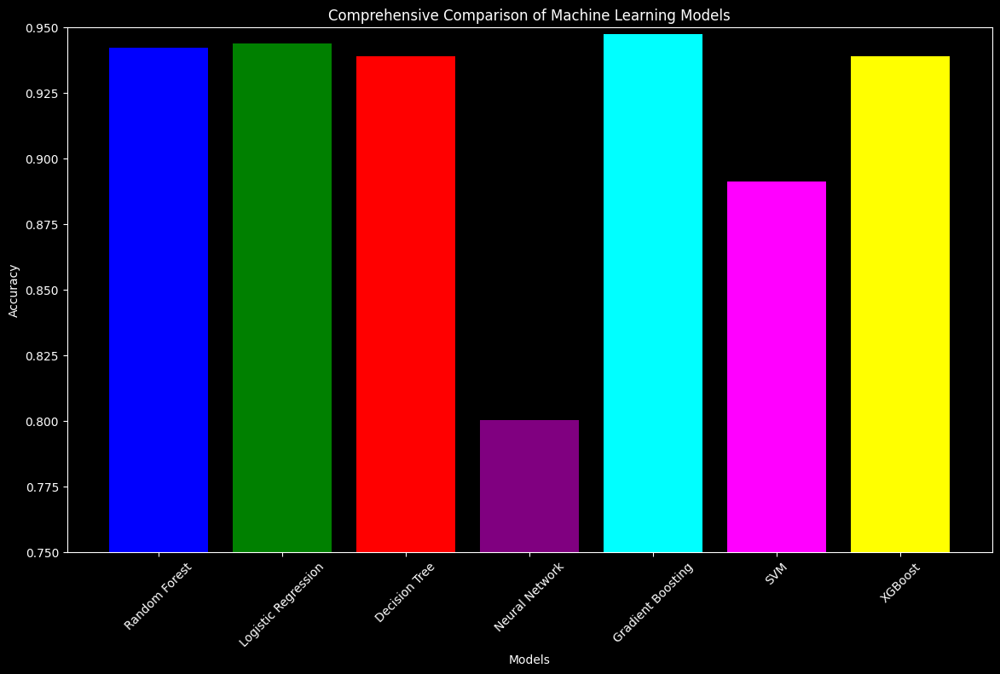

In [115]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# Initialize the models and their respective predictions
models_predictions = {
    'Random Forest': y_pred,
    'Logistic Regression': y_pred_log,
    'Decision Tree': y_pred_tree,
    'Neural Network': y_pred_nn,
    'Gradient Boosting': y_pred_gb,
    'SVM': y_pred_svm,
    'XGBoost': y_pred_xgb,
}

# Calculate and store accuracies for all models
accuracies = {model: accuracy_score(y_test, prediction) for model, prediction in models_predictions.items()}

# Creating a bar plot for comparison of all models
plt.figure(figsize=(14, 8))  # Adjust figure size to fit all model names
colors = ['blue', 'green', 'red', 'purple', 'cyan', 'magenta', 'yellow']  # One color for each model
plt.bar(accuracies.keys(), accuracies.values(), color=colors)
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Comprehensive Comparison of Machine Learning Models')
plt.xticks(rotation=45)  # Rotate model names for better readability
plt.ylim([0.75, 0.95])
plt.show()

In [116]:
import plotly.graph_objects as go

models_predictions = {
    'Random Forest': y_pred,
    'Logistic Regression': y_pred_log,
    'Decision Tree': y_pred_tree,
    'Neural Network': y_pred_nn,
    'Gradient Boosting': y_pred_gb,
    'SVM': y_pred_svm,
    'XGBoost': y_pred_xgb,
}

# Calculate and store accuracies for all models
accuracies = {model: accuracy_score(y_test, prediction) for model, prediction in models_predictions.items()}

# Create the figure object
fig = go.Figure()

# Add a bar for each model
for model, accuracy in accuracies.items():
    fig.add_trace(go.Bar(
        x=[model],
        y=[accuracy],
        name=model,
        text=str(round(accuracy, 4)),
        textposition='auto',
        marker_color=plt.cm.tab10(list(models_predictions.keys()).index(model))  # Color mapping using matplotlib
    ))

# Update layout to add titles and adjust visual elements
fig.update_layout(
    title='Comprehensive Comparison of Machine Learning Models',
    xaxis_title='Models',
    yaxis_title='Accuracy',
    yaxis=dict(range=[0.75, 0.95]),  # Adjust scale to better visualize differences
    showlegend=False
)

# Show the plot
fig.show()
fig.write_html("Comparison of ML models.html")

In [117]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
import pandas as pd

# Load and prepare the data
vote = pd.read_csv('/content/LS_2.0.csv.xls', delimiter=',')
vote.columns = vote.columns.str.replace('\n', ' ', regex=True).str.strip()
vote_df = vote[vote['PARTY'] != 'NOTA'].drop(['ASSETS', 'LIABILITIES', 'SYMBOL', 'NAME'], axis=1)
vote_df['CRIMINAL CASES'] = pd.to_numeric(vote_df['CRIMINAL CASES'], errors='coerce')
vote_df.fillna({'CRIMINAL CASES': 0}, inplace=True)
vote_df = pd.get_dummies(vote_df, columns=['STATE', 'CONSTITUENCY', 'PARTY', 'EDUCATION', 'GENDER', 'CATEGORY'], drop_first=True)

# Define features and target
X = vote_df.drop('WINNER', axis=1)
y = vote_df['WINNER']

# Train the model on the entire dataset
gb = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)
gb.fit(X, y)

GradientBoostingClassifier(random_state=42)

In [118]:
# Display all feature names used in the model
feature_names = list(vote_df.drop('WINNER', axis=1).columns)
print("Features used in the model:", feature_names)


Features used in the model: ['CRIMINAL CASES', 'AGE', 'GENERAL VOTES', 'POSTAL VOTES', 'TOTAL VOTES', 'OVER TOTAL ELECTORS  IN CONSTITUENCY', 'OVER TOTAL VOTES POLLED  IN CONSTITUENCY', 'TOTAL ELECTORS', 'STATE_Andhra Pradesh', 'STATE_Arunachal Pradesh', 'STATE_Assam', 'STATE_Bihar', 'STATE_Chandigarh', 'STATE_Chhattisgarh', 'STATE_Dadra & Nagar Haveli', 'STATE_Daman & Diu', 'STATE_Goa', 'STATE_Gujarat', 'STATE_Haryana', 'STATE_Himachal Pradesh', 'STATE_Jammu & Kashmir', 'STATE_Jharkhand', 'STATE_Karnataka', 'STATE_Kerala', 'STATE_Lakshadweep', 'STATE_Madhya Pradesh', 'STATE_Maharashtra', 'STATE_Manipur', 'STATE_Meghalaya', 'STATE_Mizoram', 'STATE_NCT OF Delhi', 'STATE_Nagaland', 'STATE_Odisha', 'STATE_Puducherry', 'STATE_Punjab', 'STATE_Rajasthan', 'STATE_Sikkim', 'STATE_Tamil Nadu', 'STATE_Telangana', 'STATE_Tripura', 'STATE_Uttar Pradesh', 'STATE_Uttarakhand', 'STATE_West Bengal', 'CONSTITUENCY_AGRA', 'CONSTITUENCY_AHMADNAGAR', 'CONSTITUENCY_AHMEDABAD EAST', 'CONSTITUENCY_AHMEDABAD 

In [119]:
print([col for col in X.columns if 'Adilabad' in col])  


[]


In [120]:
# Print out a few constituency names from the model's features
constituencies = [col for col in X.columns if 'CONSTITUENCY_' in col]
print(constituencies[:20])

['CONSTITUENCY_AGRA', 'CONSTITUENCY_AHMADNAGAR', 'CONSTITUENCY_AHMEDABAD EAST', 'CONSTITUENCY_AHMEDABAD WEST', 'CONSTITUENCY_AJMER', 'CONSTITUENCY_AKBARPUR', 'CONSTITUENCY_AKOLA', 'CONSTITUENCY_ALAPPUZHA', 'CONSTITUENCY_ALATHUR', 'CONSTITUENCY_ALIGARH', 'CONSTITUENCY_ALIPURDUARS', 'CONSTITUENCY_ALLAHABAD', 'CONSTITUENCY_ALMORA', 'CONSTITUENCY_ALWAR', 'CONSTITUENCY_AMALAPURAM', 'CONSTITUENCY_AMBALA', 'CONSTITUENCY_AMBEDKAR NAGAR', 'CONSTITUENCY_AMETHI', 'CONSTITUENCY_AMRAVATI', 'CONSTITUENCY_AMRELI']


In [121]:
# Setup a DataFrame with zeros for all features used in training
sample_input_df = pd.DataFrame(data=0, index=[0], columns=X.columns)

sample_input_df['CRIMINAL CASES'] = 2
sample_input_df['AGE'] = 45
sample_input_df['GENERAL VOTES'] = 50000
sample_input_df['POSTAL VOTES'] = 200
sample_input_df['TOTAL VOTES'] = 50200
sample_input_df['OVER TOTAL ELECTORS  IN CONSTITUENCY'] = 0.05
sample_input_df['OVER TOTAL VOTES POLLED  IN CONSTITUENCY'] = 0.1
sample_input_df['TOTAL ELECTORS'] = 1000000

# Setting up state, constituency, party, education, gender, category
sample_input_df['STATE_Telangana'] = 1
sample_input_df['CONSTITUENCY_AGRA'] = 1
sample_input_df['PARTY_BJP'] = 1
sample_input_df['EDUCATION_12th Pass'] = 1
sample_input_df['GENDER_MALE'] = 1
sample_input_df['CATEGORY_SC'] = 1

# Ensuring all other columns remain zero if not explicitly set above
sample_input_df.fillna(0, inplace=True)

# Predict the outcome using the trained model
predicted_winner = gb.predict(sample_input_df)
print("Predicted Winner:", "Yes" if predicted_winner[0] == 1 else "No")


Predicted Winner: No


In [127]:
import pandas as pd

# Load the dataset if not already loaded
vote = pd.read_csv('/content/LS_2.0.csv.xls', delimiter=',')
vote.columns = vote.columns.str.replace('\n', ' ', regex=True).str.strip()
vote = vote[vote['PARTY'] != 'NOTA']  # NOTA votes are not considered for modeling


vote['CRIMINAL CASES'] = pd.to_numeric(vote['CRIMINAL CASES'], errors='coerce')
vote.fillna({'CRIMINAL CASES': 0}, inplace=True)
vote = pd.get_dummies(vote, columns=['STATE', 'CONSTITUENCY', 'PARTY', 'EDUCATION', 'GENDER', 'CATEGORY'], drop_first=True)

# Extract the first row for prediction
first_row = vote.drop(['WINNER'], axis=1).iloc[0]
actual_winner = vote['WINNER'].iloc[0]

# Convert to DataFrame as the model expects a DataFrame input
first_row_df = pd.DataFrame([first_row])

# Ensure all columns from the training model are included, fill missing with zeros
# (This is just a precaution, should normally match since we're using the same preparation)
missing_cols = set(X.columns) - set(first_row_df.columns)
for c in missing_cols:
    first_row_df[c] = 0
first_row_df = first_row_df[X.columns]

# Predict the outcome using the trained model
predicted_winner = gb.predict(first_row_df)
print("Predicted Winner:", "Yes" if predicted_winner[0] == 1 else "No")
print("Actual Winner:   ", "Yes" if actual_winner == 1 else "No")

# Validation
print("Prediction Correct:", predicted_winner[0] == actual_winner)


Predicted Winner: Yes
Actual Winner:    Yes
Prediction Correct: True


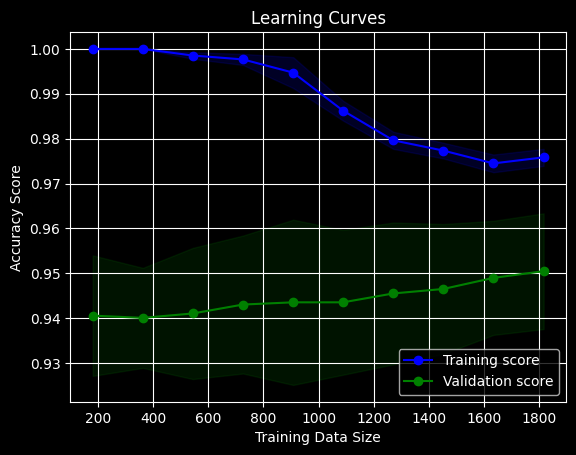

In [128]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

# Plotting learning curves
def plot_learning_curves(model, X, y):
    train_sizes, train_scores, test_scores = learning_curve(
        model, X, y, cv=10, scoring='accuracy', n_jobs=-1,
        train_sizes=np.linspace(0.1, 1.0, 10))

    # Calculating mean and standard deviation for training set scores
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)

    # Calculating mean and standard deviation for test set scores
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    # Plot the learning curves
    plt.plot(train_sizes, train_mean, label='Training score', color='blue', marker='o')
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color='blue', alpha=0.15)

    plt.plot(train_sizes, test_mean, label='Validation score', color='green', marker='o')
    plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, color='green', alpha=0.15)

    plt.title('Learning Curves')
    plt.xlabel('Training Data Size')
    plt.ylabel('Accuracy Score')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()

# Plotting learning curves for the Gradient Boosting model
plot_learning_curves(gb, X, y)
